In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
# To make the plotly graphs
from plotly.offline import iplot, init_notebook_mode
from plotly import graph_objs as go
import plotly.express as px
from plotly.graph_objs import *
import geopandas as gpd
import copy
import matplotlib.ticker as mtick
from matplotlib.ticker import FuncFormatter


import warnings
warnings.filterwarnings("ignore")

# 1. Exploratory Data Analysis of Crime and Mobility Changes Across Three Periods

## 1.1 COVID-19 Time Series Analysis & Mobility Change Analysis

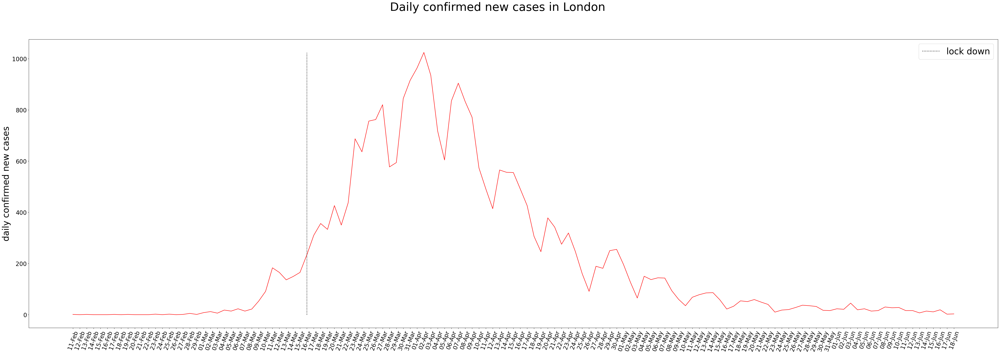

In [9]:
# London COVID-19 new cases time series.

cases_ldn=pd.read_csv('DATA/covid_19_ldn.csv')  # London COVID-19 cases number records.
cases_ldn.head()

fig, ax = plt.subplots(1, figsize=(60,18))
ax.plot(cases_ldn['date'], cases_ldn['new_cases'], color='red')
ax.xaxis.set_tick_params(rotation=70)
ax.set_ylabel('daily confirmed new cases', fontsize='30')
ax.tick_params(axis='both', which='major', labelsize=20)

fig.suptitle('Daily confirmed new cases in London', fontsize=40)

# Draw a vertical line to represent the start of the lockdown in London. 
y_min = cases_ldn['new_cases'].min()
y_max = cases_ldn['new_cases'].max()
plt.vlines(x='16-Mar', ymin=y_min, ymax=y_max, colors='black', ls=':', lw=2, label='lock down')

plt.legend(loc=1, prop={'size': 30})

plt.show()
plt.close()

In [10]:
# Calculate the average mobility change for London's 33 boroughs from October 31 to December 2.

mobile=pd.read_csv('DATA/mobility_p3.csv')
mobility_columns = mobile.select_dtypes(include=['number']).columns
mobile_avg = mobile.groupby(['borough_NM'])[mobility_columns].mean().reset_index()
mobile_avg.to_csv('OUTPUT/mobility_avg_p3.csv')

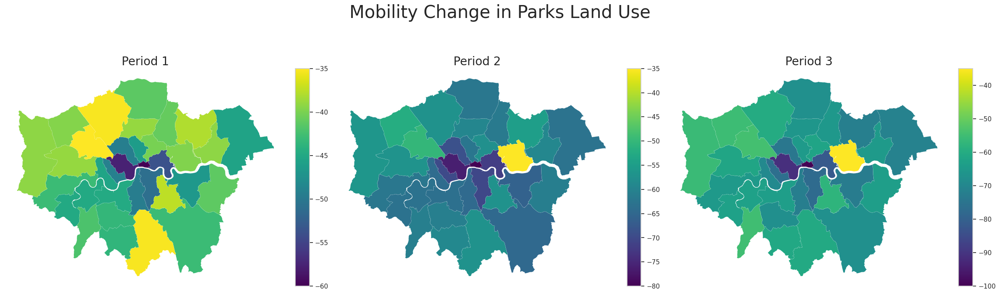

In [69]:
# Visualize the mobility change in park land use across different boroughs in London.

boroughs = gpd.read_file('DATA/Borough_cases_mobility.shp')

def geopandas_colorbar_same_height(f, ax, vmin, vmax, cmap):
    from matplotlib.colors import Normalize
    from matplotlib import cm
    from mpl_toolkits.axes_grid1 import make_axes_locatable

    # Create colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.2)

    norm = Normalize(vmin=vmin, vmax=vmax)
    n_cmap = cm.ScalarMappable(norm=norm, cmap=cmap)
    n_cmap.set_array([])

    f.colorbar(n_cmap, cax=cax)

fig, ax = plt.subplots(1, 3, figsize=(24, 8))

# Plot boroughs with smaller line width
im1 = boroughs.plot(column='p1_parks', 
                    ax=ax[0],
                    cmap='viridis',
                    linewidth=0.1)  # Adjust line width here

im2 = boroughs.plot(column='p2_parks', 
                    ax=ax[1],
                    cmap='viridis',
                    linewidth=0.1)  # Adjust line width here

im3 = boroughs.plot(column='p3_parks', 
                    ax=ax[2],
                    cmap='viridis',
                    linewidth=0.1)  # Adjust line width here

# Add colorbars with same height as each subplot
geopandas_colorbar_same_height(fig, ax[0], vmin=-60, vmax=-35, cmap='viridis')
geopandas_colorbar_same_height(fig, ax[1], vmin=-80, vmax=-35, cmap='viridis')
geopandas_colorbar_same_height(fig, ax[2], vmin=-100, vmax=-35, cmap='viridis')

# Set overall title for the entire figure
fig.suptitle('Mobility Change in Parks Land Use', fontsize=30)

# Set titles for each subplot
ax[0].set_title('Period 1', fontsize=20)
ax[1].set_title('Period 2', fontsize=20)
ax[2].set_title('Period 3', fontsize=20)

# Set background color and turn off axes
fig.patch.set_facecolor('xkcd:white')
ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')

fig.tight_layout()
plt.show()
plt.close()

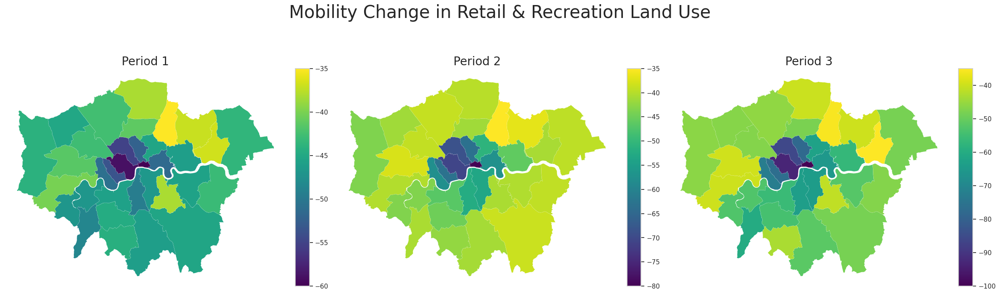

In [70]:
# Visualize the mobility change in retail & recreation land use across different boroughs in London.

fig, ax = plt.subplots(1, 3, figsize=(24, 8))

# Plot boroughs with smaller line width
im1 = boroughs.plot(column='p1_retail_', 
                    ax=ax[0],
                    cmap='viridis',
                    linewidth=0.1)  # Adjust line width here

im2 = boroughs.plot(column='p2_retail_', 
                    ax=ax[1],
                    cmap='viridis',
                    linewidth=0.1)  # Adjust line width here

im3 = boroughs.plot(column='p3_retail_', 
                    ax=ax[2],
                    cmap='viridis',
                    linewidth=0.1)  # Adjust line width here

# Add colorbars with same height as each subplot
geopandas_colorbar_same_height(fig, ax[0], vmin=-60, vmax=-35, cmap='viridis')
geopandas_colorbar_same_height(fig, ax[1], vmin=-80, vmax=-35, cmap='viridis')
geopandas_colorbar_same_height(fig, ax[2], vmin=-100, vmax=-35, cmap='viridis')

# Set overall title for the entire figure
fig.suptitle('Mobility Change in Retail & Recreation Land Use', fontsize=30)

# Set titles for each subplot
ax[0].set_title('Period 1', fontsize=20)
ax[1].set_title('Period 2', fontsize=20)
ax[2].set_title('Period 3', fontsize=20)

# Set background color and turn off axes
fig.patch.set_facecolor('xkcd:white')
ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')

fig.tight_layout()
plt.show()
plt.close()

## 1.2 Spatio-temporal Analysis of Crime Pattern Changes

In [14]:
# Load the number of crimes at the LSOA level in London from December 2018 to November 2020.

crime_1218_1120_df = pd.read_csv('DATA/LSOA_borough data/MPS LSOA Level Crime 1218-1120.csv')
crime_monthly_by_type = crime_1218_1120_df.groupby(['Major Category']).sum().reset_index()  # Calculate the total number of each type of crime for different months.
crime_monthly_by_type.to_csv('OUTPUT/crime_monthly_by_type.csv')
crime_monthly_by_type

,Major Category,201812,201901,201902,201903,201904,201905,201906,201907,201908,...,202002,202003,202004,202005,202006,202007,202008,202009,202010,202011
0,Arson and Criminal Damage,4648,4530,4346,4931,4654,4835,4639,4825,4522,...,4312,4333,3463,3884,4324,4682,4692,4296,4311,4159
1,Burglary,7131,7436,6658,7203,6290,6382,6344,6293,6137,...,6284,5338,3644,3879,4296,4937,4987,5180,5632,5186
2,Drug Offences,3226,3439,3399,4346,3630,3827,4014,4492,4763,...,4110,3896,5197,6669,4816,4726,3663,3620,4161,4361
3,Miscellaneous Crimes Against Society,805,842,870,983,884,992,923,955,857,...,829,891,814,871,923,936,835,1012,837,968
4,Possession of Weapons,604,629,643,810,546,627,550,572,606,...,517,558,497,597,503,514,506,533,517,507
5,Public Order Offences,3629,3444,3600,4351,3991,4417,4515,5132,4532,...,3951,3975,3472,4247,4941,5663,5477,5204,4614,4203
6,Robbery,2950,2919,2960,3155,3369,3250,3103,3354,3015,...,3174,2681,1093,1289,1687,2165,2484,2572,2446,2267
7,Theft,19183,18901,19629,21176,21202,21375,20847,22210,20327,...,19552,14698,7239,8906,11438,15077,16075,16534,16793,12933
8,Vehicle Offences,9534,10780,9606,10706,10026,9824,9845,10131,10004,...,10640,9386,6313,7208,8051,8943,8864,10099,10545,9118
9,Violence Against the Person,17658,17108,16526,18402,17178,18504,18735,19931,18254,...,16944,17362,15285,17599,18810,20012,20214,19333,18369,17823


In [15]:
# Load the number of crimes at the LSOA level in London from January 2008 to December 2018.

crime_0108_1218_df = pd.read_csv('DATA/LSOA_borough data/MPS_Borough_Level_Crime_Historic.csv')
crime_monthly_by_type_his = crime_0108_1218_df.groupby(['Major Category']).sum().reset_index()  # Calculate the total number of each type of crime for different months.
crime_monthly_by_type_his.to_csv('OUTPUT/crime_monthly_by_type_his.csv')
crime_monthly_by_type_his

,Major Category,200801,200802,200803,200804,200805,200806,200807,200808,200809,...,201803,201804,201805,201806,201807,201808,201809,201810,201811,201812
0,Burglary,8839,7661,7891,7218,7285,7395,7402,7570,6964,...,7638,7626,7549,7284,7436,7795,7346,8483,9187,8479
1,Criminal Damage,8590,8192,8349,8628,8797,8491,8351,7950,7815,...,4749,4939,5164,5006,5224,4737,4638,5005,4888,4829
2,Drugs,5947,6854,6548,5815,6659,6161,6978,6690,6519,...,2803,2981,3048,2686,2607,3315,2951,3061,3208,3096
3,Fraud or Forgery,2874,2860,2869,3323,2949,3341,3752,3325,3368,...,107,115,118,96,102,96,106,79,115,97
4,Other Notifiable Offences,892,860,925,881,887,1050,1000,939,977,...,1525,1386,1577,1471,1810,1419,1428,1561,1403,1310
5,Robbery,3157,2723,2878,2844,2775,2739,2645,2502,2476,...,2601,2554,2607,2895,2971,2548,2648,2927,3042,3000
6,Sexual Offences,745,711,788,724,786,852,847,735,711,...,1691,1589,1816,1861,2016,1649,1731,1775,1726,1479
7,Theft and Handling,26692,25493,26283,26271,26311,26475,27514,25235,25344,...,24880,25084,26031,26083,27422,26374,26617,29135,29116,27719
8,Violence Against the Person,13828,13208,14408,13690,15900,15971,16332,14534,13835,...,21148,20572,23420,23142,25050,21238,21294,21955,21564,21533


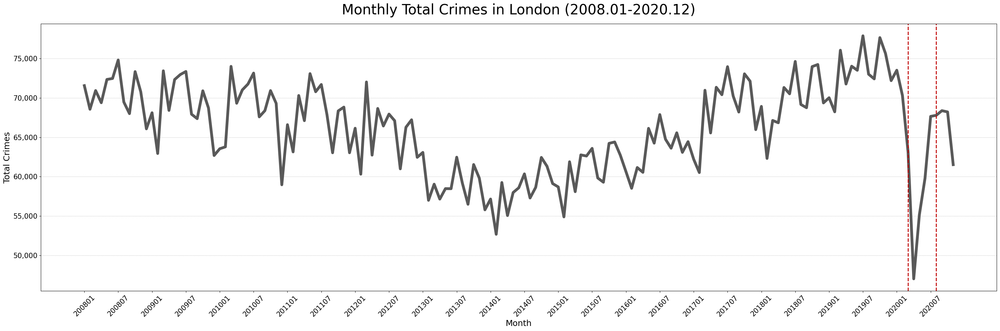

In [16]:
# Plot the total crimes number from 200801 to 202011

# Merge data and calculate total crimes for each month
line_plot_df = pd.concat(
    [crime_monthly_by_type_his.iloc[:, :-1], crime_monthly_by_type.iloc[:, 1:]], axis=1
)
line_plot_df = line_plot_df.set_index("Major Category").transpose()
line_plot_df["Total Crimes"] = line_plot_df.sum(axis=1)

# Create figure and axis objects
fig, ax = plt.subplots(figsize=(30, 10))

# Plot the total monthly crimes
plt.plot(line_plot_df.index, line_plot_df["Total Crimes"], linewidth=6, color="#595959")

# Set the title of the plot
ax.set_title("Monthly Total Crimes in London (2008.01-2020.12)", fontsize=30, pad=20)

# Set x-axis and y-axis labels
ax.set_xlabel("Month", fontsize=18)
ax.set_ylabel("Total Crimes", fontsize=18)

# Customize x-axis tick labels and rotation
ax.set_xticks(range(0, len(line_plot_df), 6))
ax.set_xticklabels(line_plot_df.index[::6], rotation=45, fontsize=15)

# Format y-axis labels with commas
ax.get_yaxis().set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{y:,.0f}"))
ax.tick_params(axis="y", labelsize=15)  # Increase font size for y-axis labels

# Add grid lines for the y-axis
ax.grid(axis="y", linestyle="dashed", linewidth=0.5)

# Add vertical lines at specific positions with labels
line_positions = ["202003", "202008"]

# Find the index positions of line_positions and draw vertical lines
for position in line_positions:
    if position in line_plot_df.index:
        idx = line_plot_df.index.tolist().index(position)
        ax.axvline(x=idx, color="#c00000", linestyle="dashed", linewidth=2)

# Display the plot
plt.tight_layout()
plt.show()


In [17]:
# Store the total number of different crime types for each month during the lockdown period (2019-03 to 2020-08) in a separate dataframe.

March2019 = crime_1218_1120_df.loc[:,['LSOA Code', 'Major Category', '201903']]
April2019 = crime_1218_1120_df.loc[:,['LSOA Code', 'Major Category', '201904']]
May2019 = crime_1218_1120_df.loc[:,['LSOA Code', 'Major Category', '201905']]
Nov2019 = crime_1218_1120_df.loc[:,['LSOA Code', 'Major Category', '201911']]
Aug2019 = crime_1218_1120_df.loc[:,['LSOA Code', 'Major Category', '201908']]
March2020 = crime_1218_1120_df.loc[:,['LSOA Code', 'Major Category', '202003']]
April2020 = crime_1218_1120_df.loc[:,['LSOA Code', 'Major Category', '202004']]
May2020 = crime_1218_1120_df.loc[:,['LSOA Code', 'Major Category', '202005']]
Nov2020 = crime_1218_1120_df.loc[:,['LSOA Code', 'Major Category', '202011']]
Aug2020 = crime_1218_1120_df.loc[:,['LSOA Code', 'Major Category', '202008']]

In [18]:
# Calculate the difference in the number of various types of crimes across different LSOAs for March, April, May, August, and November in 2019 and 2020 to assess the impact of lockdown on crime patterns.

crime_1218_1120_df['March_c'] = crime_1218_1120_df['202003'] - crime_1218_1120_df['201903']
crime_1218_1120_df['April_c'] = crime_1218_1120_df['202004'] - crime_1218_1120_df['201904']
crime_1218_1120_df['May_c'] = crime_1218_1120_df['202005'] - crime_1218_1120_df['201905']
crime_1218_1120_df['Aug_c'] = crime_1218_1120_df['202008'] - crime_1218_1120_df['201908']
crime_1218_1120_df['Nov_c'] = crime_1218_1120_df['202011'] - crime_1218_1120_df['201911']

# Consolidate the difference in the number of various types of crimes across different LSOAs for March, April, May, August, and November in 2019 and 2020 into a new dataframe.
change = pd.pivot_table(
    crime_1218_1120_df, 
    values=['March_c','April_c','May_c', 'Aug_c','Nov_c'],
    index=['LSOA Code', 'Major Category'],
    aggfunc={'March_c': np.sum,'April_c': np.sum, 'May_c': np.sum, 'Aug_c': np.sum, 'Nov_c':np.sum})
change.to_csv('lockdown_change_ldn.csv')
change_total=change.groupby('LSOA Code').sum().reset_index()  # Calculate the difference in total crime counts across different LSOAs for March, April, May, August, and November in 2019 and 2020.
change_type=change.groupby('Major Category').sum().reset_index()  # Calculate the difference in crime counts for various crime types in March, April, May, August, and November between 2019 and 2020.


In [19]:
# Calculate the change ratio of each crime category

month_mapping = {
    "March_c": "201903",
    "April_c": "201904",
    "May_c": "201905",
    "Aug_c": "201908",
    "Nov_c": "201911"
}
change_type_pct = change_type.copy(deep=True).iloc[:, [0]]
for month in change_type.columns.to_list()[1:]:
    change_pct = pd.merge(
        change_type.loc[:, ["Major Category", month]],
        crime_monthly_by_type.loc[:, ["Major Category", month_mapping[month]]],
        on="Major Category",
        how="inner"
        )
    change_type_pct[month[:-1]+"ratio"] = (change_pct[month]/change_pct[month_mapping[month]]).round(3)

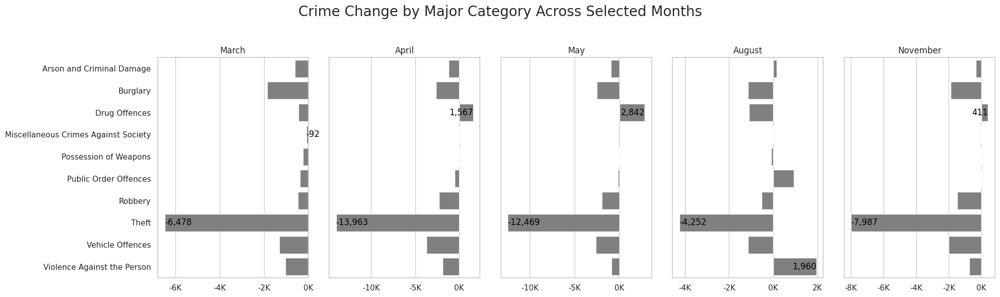

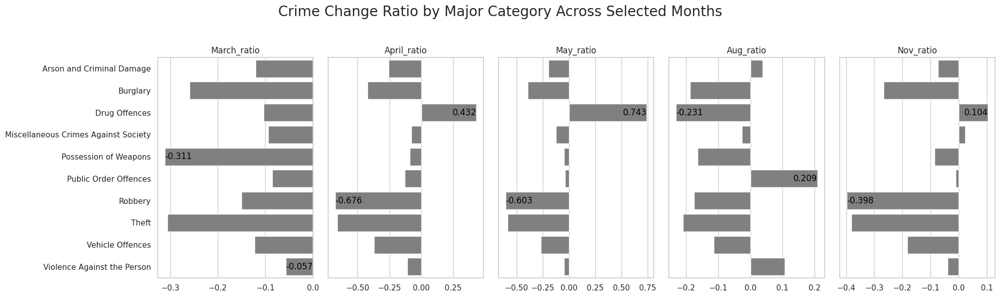

In [73]:
# Visualises crime changes and their ratios across different months by major category using horizontal bar charts.

# Set the x-axis tick format to "K" style
def format_ticks(value, _):
    return f"{int(value / 1000)}K"

def plot_crime_change_by_type(change_df, month_list):

    # Map month names
    month_mapping = {
        "March_c": "March",
        "April_c": "April",
        "May_c": "May",
        "Aug_c": "August",
        "Nov_c": "November"
    }

    # Set up the canvas
    sns.set(style="whitegrid")
    fig, axes = plt.subplots(1, 5, figsize=(20, 6), sharey=True)

    # Retrieve unique months and their order
    months = month_list

    # Iterate through each month and plot crime categories
    for idx, month in enumerate(months):

        ax = axes[idx]
        # Select the data for the current month
        monthly_data = change_df.loc[:, ["Major Category", month]]

        # Identify the maximum and minimum values
        max_idx = monthly_data[month].idxmax()
        min_idx = monthly_data[month].idxmin()
        
        # Add a highlight column for max and min values
        monthly_data["Highlight"] = False
        monthly_data.loc[max_idx, "Highlight"] = True

        # Plot the horizontal bar chart
        sns.barplot(
            x=month, 
            y="Major Category", 
            data=monthly_data, 
            color="gray", 
            ax=ax
        )

        # Add labels and titles
        ax.set_title(month, fontsize=12)
        ax.set_xlabel("")
        ax.set_ylabel("")

        # Annotate the maximum and minimum values
        for i, val in enumerate(monthly_data[month]):
            if i == max_idx or i == min_idx:  # Only annotate max and min values
                ax.text(val, i, f"{val:,}", color="black", va="center", 
                        ha="left" if val < 0 else "right")
        
        # Set axis tick format
        if month in month_mapping.keys():
            ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
            ax.set_title(month_mapping[month], fontsize=12)
            fig.suptitle("Crime Change by Major Category Across Selected Months", fontsize=20)
        else:
            ax.set_title(month, fontsize=12)
            fig.suptitle("Crime Change Ratio by Major Category Across Selected Months", fontsize=20)
    

    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

plot_crime_change_by_type(change_type, ["March_c", "April_c", "May_c", "Aug_c", "Nov_c"])
plot_crime_change_by_type(change_type_pct, ["March_ratio", "April_ratio", "May_ratio", "Aug_ratio", "Nov_ratio"])

In [21]:
# Merge the London shapefile with the crime change dataframe.

ldn = gpd.read_file('DATA/London.shp')  # London LSOAs boundaries shapefile.
ldn_crime = ldn.merge(change_total, left_on='lsoa11cd', right_on='LSOA Code')
ldn_crime.to_file('OUTPUT/crimechange.shp')

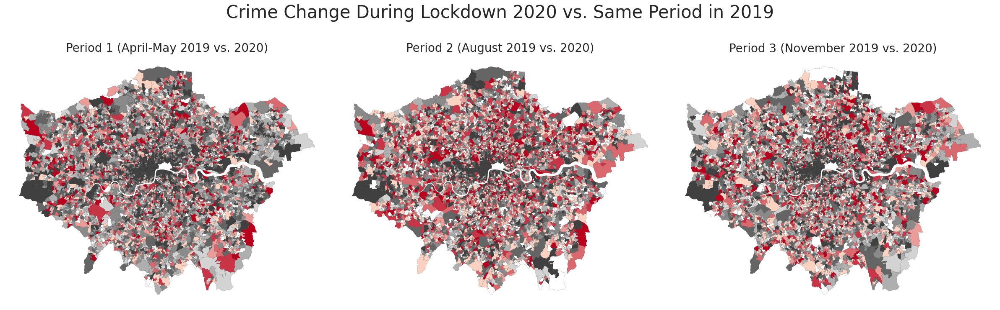

In [78]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Load crime change data
ldn_crime = gpd.read_file('OUTPUT/crimechange.shp')

# Calculate the total change for three different periods
ldn_crime['Period_1'] = ldn_crime['April_c'] + ldn_crime['May_c']
ldn_crime['Period_2'] = ldn_crime['Aug_c']
ldn_crime['Period_3'] = ldn_crime['Nov_c']

# Define a function to plot crime change with adjustable transparency for negative and positive values
def plot_crime_change(ax, df, column_name, title, linewidth=0.1, negative_alpha=1.0, positive_alpha=1.0):
    # Create custom LinearSegmentedColormap
    negative_colors = ["#404040", "lightgrey"]
    negative_cmap = LinearSegmentedColormap.from_list("custom_greys_negative", negative_colors)
    positive_colors = ["#fad2c1", "#b9001d"]
    positive_cmap = LinearSegmentedColormap.from_list("custom_greys_positive", positive_colors)

    # Split positive, negative, and zero values
    positive_change = df[df[column_name] > 0]
    negative_change = df[df[column_name] < 0]
    zero_change = df[df[column_name] == 0]

    # Plot zero values (white)
    zero_change.plot(
        ax=ax, color='white', edgecolor='black', linewidth=linewidth,
        legend=False, missing_kwds={"color": "lightgrey"}
    )

    # Plot negative values (grey) with adjustable transparency
    negative_change.plot(
        column=column_name, ax=ax, edgecolor='black', linewidth=linewidth,
        cmap=negative_cmap, scheme='quantiles', legend=False,
        alpha=negative_alpha,
        missing_kwds={"color": "lightgrey"}
    )

    # Plot positive values (red) with adjustable transparency
    positive_change.plot(
        column=column_name, ax=ax, edgecolor='black', linewidth=linewidth,
        cmap=positive_cmap, scheme='quantiles', legend=False,
        alpha=positive_alpha,
        missing_kwds={"color": "lightgrey"}
    )

    # Set title and remove axes
    # ax.title.set_text(title)
    ax.set_title(title, fontsize=20)
    ax.axis('off')

# Create canvas and multiple subplots
f, axes = plt.subplots(1, 3, figsize=(24, 8))
plt.suptitle('Crime Change During Lockdown 2020 vs. Same Period in 2019', fontsize=30)

# Use the defined function to plot multiple subplots
plot_crime_change(axes[0], ldn_crime, 'Period_1', 'Period 1 (April-May 2019 vs. 2020)')
plot_crime_change(axes[1], ldn_crime, 'Period_2', 'Period 2 (August 2019 vs. 2020)')
plot_crime_change(axes[2], ldn_crime, 'Period_3', 'Period 3 (November 2019 vs. 2020)')

# Display plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout
plt.show()
plt.close()


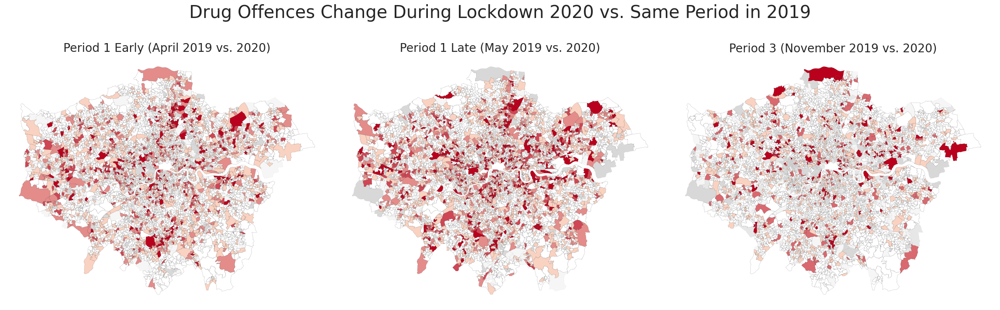

In [79]:
# Visualize the changes in drug offences during the pandemic.

# Extract "Drug Offences" data into a separate dataframe
drug_offences_change = change.xs('Drug Offences', level='Major Category')
ldn_drug_offences = ldn.merge(drug_offences_change, left_on='lsoa11cd', right_on='LSOA Code')

# Create canvas and multiple subplots
f, axes = plt.subplots(1, 3, figsize=(24, 8))
plt.suptitle('Drug Offences Change During Lockdown 2020 vs. Same Period in 2019', fontsize=30)

# Use the defined function to plot multiple subplots
plot_crime_change(axes[0], ldn_drug_offences, 'April_c', 'Period 1 Early (April 2019 vs. 2020)', negative_alpha=0.2)
plot_crime_change(axes[1], ldn_drug_offences, 'May_c', 'Period 1 Late (May 2019 vs. 2020)', negative_alpha=0.2)
plot_crime_change(axes[2], ldn_drug_offences, 'Aug_c', 'Period 3 (November 2019 vs. 2020)', negative_alpha=0.2)

# Display plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout
plt.show()
plt.close()

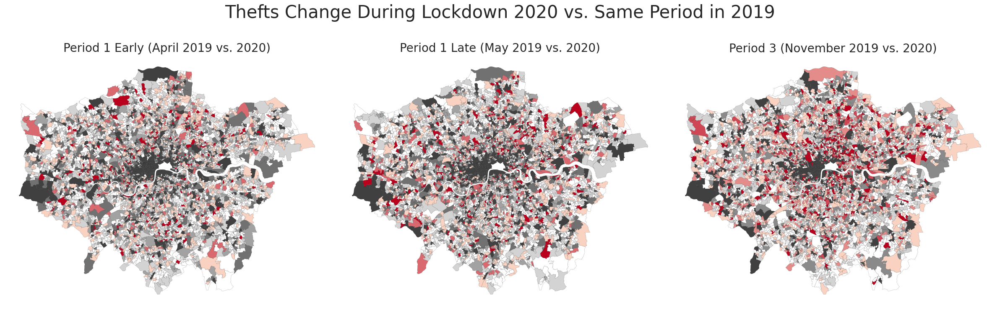

In [80]:
# Visualize the changes in thefts during the pandemic.

# Extract "thefts" data into a separate dataframe
theft_change = change.xs('Theft', level='Major Category')
ldn_theft_offences = ldn.merge(theft_change, left_on='lsoa11cd', right_on='LSOA Code')

# Create canvas and multiple subplots
f, axes = plt.subplots(1, 3, figsize=(24, 8))
plt.suptitle('Thefts Change During Lockdown 2020 vs. Same Period in 2019', fontsize=30)

# Use the defined function to plot multiple subplots
plot_crime_change(axes[0], ldn_theft_offences, 'April_c', 'Period 1 Early (April 2019 vs. 2020)')
plot_crime_change(axes[1], ldn_theft_offences, 'May_c', 'Period 1 Late (May 2019 vs. 2020)')
plot_crime_change(axes[2], ldn_theft_offences, 'Aug_c', 'Period 3 (November 2019 vs. 2020)')

# Display plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout
plt.show()
plt.close()

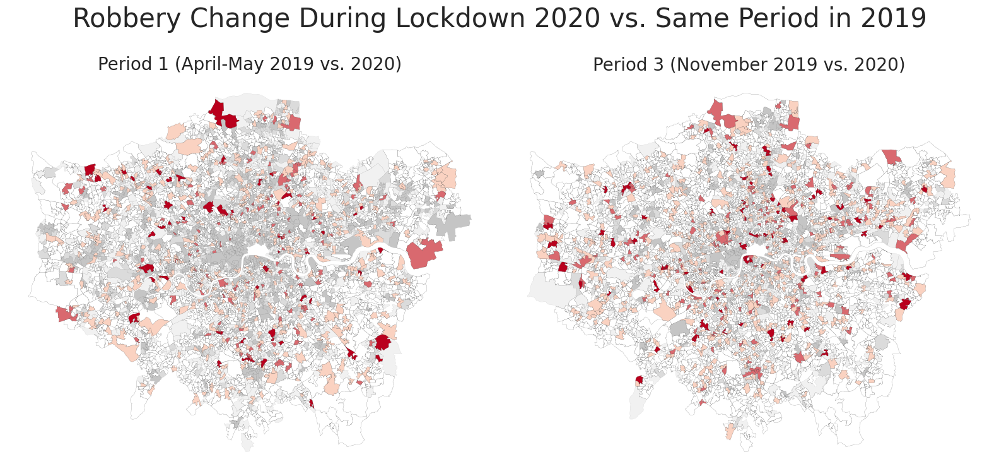

In [81]:
# Visualize the changes in robbery during the pandemic.

# Extract "robbery" data into a separate dataframe
robbery_change = change.xs('Robbery', level='Major Category')

# Calculate total change for Period 1 (April + May)
robbery_change['Period_1'] = robbery_change['April_c'] + robbery_change['May_c']

# Merge with geographic dataframe
ldn_robbery_offences = ldn.merge(robbery_change, left_on='lsoa11cd', right_on='LSOA Code')

# Create canvas and multiple subplots
f, axes = plt.subplots(1, 2, figsize=(16, 8))  # Only two subplots since we only visualize two periods
plt.suptitle('Robbery Change During Lockdown 2020 vs. Same Period in 2019', fontsize=30)

# Use the defined function to plot multiple subplots
plot_crime_change(axes[0], ldn_robbery_offences, 'Period_1', 'Period 1 (April-May 2019 vs. 2020)', negative_alpha=0.3)
plot_crime_change(axes[1], ldn_robbery_offences, 'Nov_c', 'Period 3 (November 2019 vs. 2020)', negative_alpha=0.3)

# Display plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout
plt.show()
plt.close()

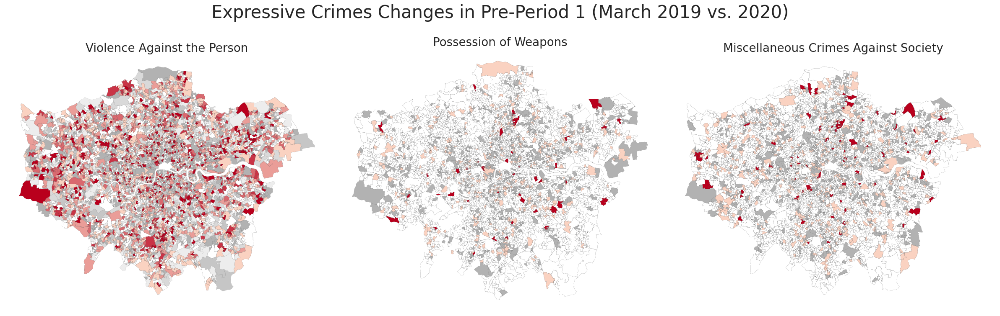

In [82]:
# Define the expressive crimes to be visualized
expressive_crimes = [
    'Violence Against the Person',
    'Possession of Weapons',
    'Miscellaneous Crimes Against Society'
]

# Extract the changes for the expressive crimes for March
expressive_change = change[change.index.get_level_values('Major Category').isin(expressive_crimes)]

# Create a canvas and three subplots for visualization
f, axes = plt.subplots(1, 3, figsize=(24, 8))
plt.suptitle('Expressive Crimes Changes in Pre-Period 1 (March 2019 vs. 2020)', fontsize=30)

# Iterate over each expressive crime category to plot the corresponding changes
for ax, crime in zip(axes, expressive_crimes):
    # Extract changes for a specific expressive crime category
    crime_change = expressive_change.xs(crime, level='Major Category')

    # Merge with geographic dataframe
    ldn_crime_change = ldn.merge(crime_change, left_on='lsoa11cd', right_on='LSOA Code')

    # Plot the crime change for March on the corresponding subplot
    plot_crime_change(ax, ldn_crime_change, 'March_c', crime, negative_alpha=0.4)

# Display the plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout
plt.show()
plt.close()

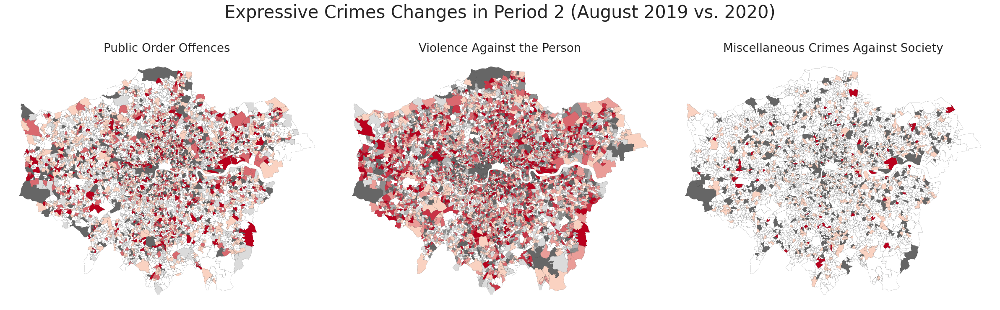

In [83]:
# Define the expressive crimes to be visualized
expressive_crimes = [
    'Public Order Offences',
    'Violence Against the Person',
    'Miscellaneous Crimes Against Society'
]

# Extract the changes for the expressive crimes for August (Period 2)
expressive_change = change[change.index.get_level_values('Major Category').isin(expressive_crimes)]

# Create a canvas and three subplots for visualization
f, axes = plt.subplots(1, 3, figsize=(24, 8))
plt.suptitle('Expressive Crimes Changes in Period 2 (August 2019 vs. 2020)', fontsize=30)

# Iterate over each expressive crime category to plot the corresponding changes
for ax, crime in zip(axes, expressive_crimes):
    # Extract changes for a specific expressive crime category
    crime_change = expressive_change.xs(crime, level='Major Category')

    # Merge with geographic dataframe
    ldn_crime_change = ldn.merge(crime_change, left_on='lsoa11cd', right_on='LSOA Code')

    # Plot the crime change for August on the corresponding subplot
    plot_crime_change(ax, ldn_crime_change, 'Aug_c', crime, negative_alpha=0.8)

# Display the plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout
plt.show()
plt.close()

# 2. LSOAs Profiling Clusters using DBSCAN

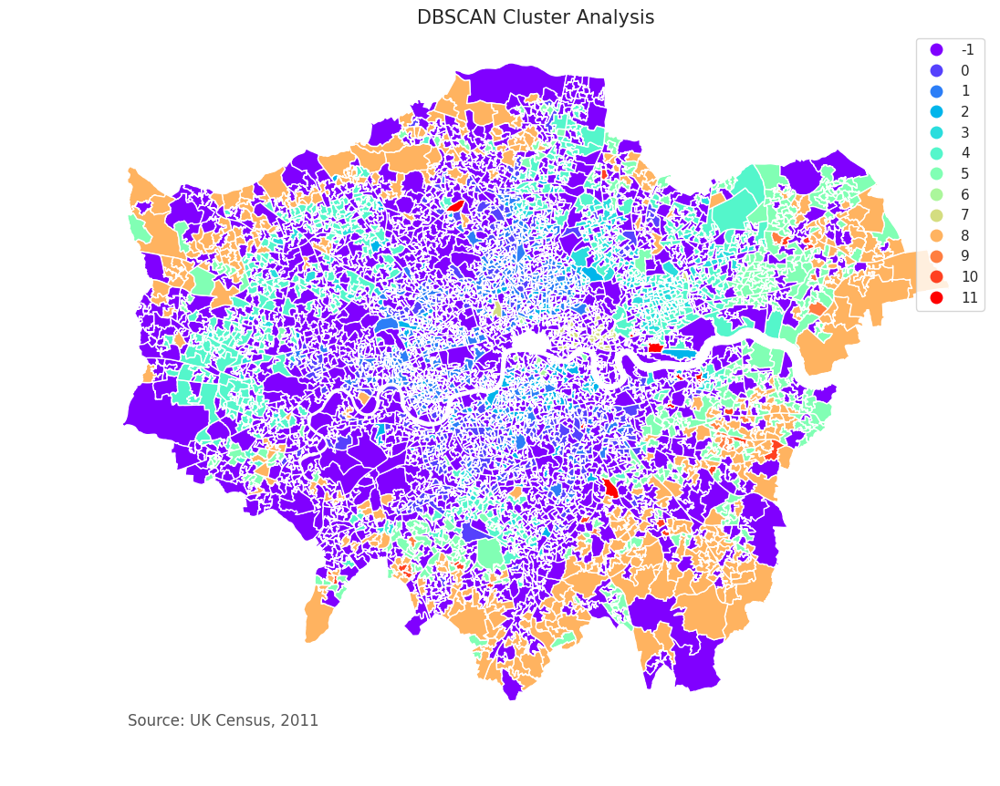

In [59]:
# Set up the plot configuration
fig, ax = plt.subplots(1, figsize=(14, 10))

# Extract relevant columns for clustering results
cluster_results = ldn[['lsoa11cd', 'clusters_D', 'geometry']]

# Plot the map with clustering results
cluster_results.assign(cl=ldn['clusters_D']).plot(
    column='clusters_D',
    cmap='rainbow',
    categorical=True,
    legend=True,
    ax=ax
)

# Add a title to the map
ax.set_title(
    'DBSCAN Cluster Analysis',
    fontdict={'fontsize': 15, 'fontweight': 2}
)

# Annotate the data source
ax.annotate(
    'Source: UK Census, 2011',
    xy=(0.1, 0.08),
    xycoords='figure fraction',
    horizontalalignment='left',
    verticalalignment='top',
    fontsize=12,
    color='#555555'
)

# Turn off the axes
ax.axis('off')

# Display and close the plot
plt.show()
plt.close()


# 3. Geographiclally Weighted Regression Analysis

In [28]:
# Loading the Geodata.
gwr_gdf = copy.deepcopy(ldn_crime)

crime = gwr_gdf['Aug_c']  # We extract the crime change data for Period 2 (August).
y = np.array(crime)
y.shape = (len(crime),1)

# Value for independent variables into a one dimmensional array X. 
X= []
X.append(gwr_gdf['clusters_D']) # average house price
X.append(gwr_gdf['IncScore']) # Income score in 2019
X.append(gwr_gdf['EmpScore']) # Income score in 2019
X.append(gwr_gdf['CriScore']) # Income score in 2019
X.append(gwr_gdf['EduScore']) # Education score in 2019
X.append(gwr_gdf['BHSScore']) # Barrier to Housing Services score in 2019
X.append(gwr_gdf['IMDScore']) # Deprivation index in 2019

X = np.array(X).T

In [29]:
# Dependent variable
y = gwr_gdf['Aug_c']
y = np.array(y).reshape(-1,1)

In [30]:
# Design matrix - covariates - intercept added automatically
clusters = np.array(gwr_gdf.clusters_D).reshape(-1,1)
income_score = np.array(gwr_gdf.IncScore).reshape(-1,1)
educa_score = np.array(gwr_gdf.EduScore).reshape(-1,1)
barri_score = np.array(gwr_gdf.BHSScore).reshape(-1,1)
imd_score = np.array(gwr_gdf.IMDScore).reshape(-1,1)
emp_score = np.array(gwr_gdf.EmpScore).reshape(-1,1)
crime_score = np.array(gwr_gdf.CriScore).reshape(-1,1)

X = np.hstack([clusters, income_score, educa_score, barri_score, imd_score, emp_score, crime_score])
labels = ['Intercept', 'clusters', 'income_score', 'educa_score', 'barri_score', 'imd_score', 'emp_score', 'crime_score']

# Standardization
X_s = (X - X.mean(axis=0)) / X.std(axis=0)
y_s = (y - y.mean(axis=0)) / y.std(axis=0)

In [31]:
# Coordinates for calibration points
def getXY(pt):
    return (pt.x, pt.y)
centroidseries = gwr_gdf['geometry'].centroid
u,v = [list(t) for t in zip(*map(getXY, centroidseries))]

coords = list(zip(u,v))

In [32]:
from pysal.model.mgwr import sel_bw

# Select bandwidth for kernel
bw = sel_bw.Sel_BW(coords, 
            y,
            X,
            fixed=False,
            spherical=True)
# calculate the optimum bandwidth for our local regression
bw.search(bw_min=2)

/home/webber/anaconda3/envs/ui2022/lib/python3.9/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.
  warnings.warn(
/home/webber/anaconda3/envs/ui2022/lib/python3.9/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.
  warnings.warn(
/home/webber/anaconda3/envs/ui2022/lib/python3.9/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.11.4-CAPI-1.17.4) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.
  warnings.warn(
/home/webber/anaconda3/envs/ui2022/lib/python3.9/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.11.4-C

4816.0

In [33]:
from pysal.model.mgwr import gwr

# Instantiate GWR model and then estimate parameters and diagnostics using fit method
model = gwr.GWR(coords, y, X, bw.bw[0])
results = model.fit()

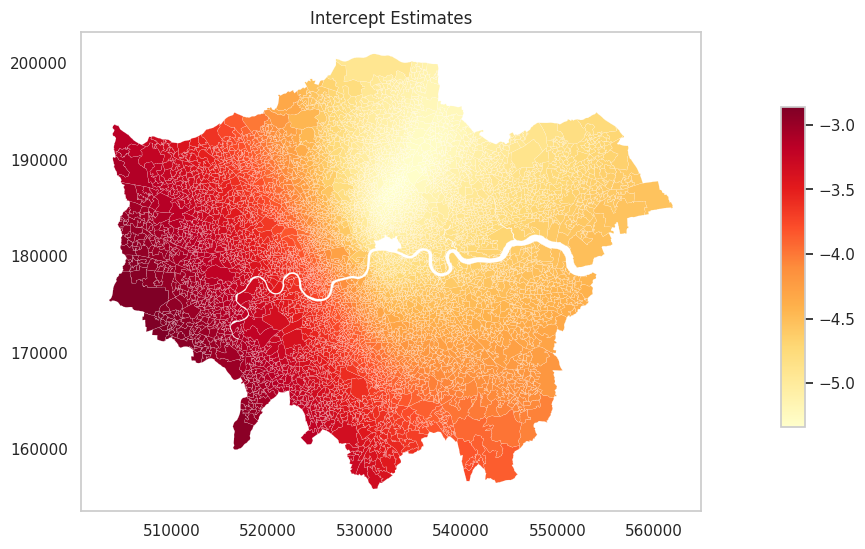

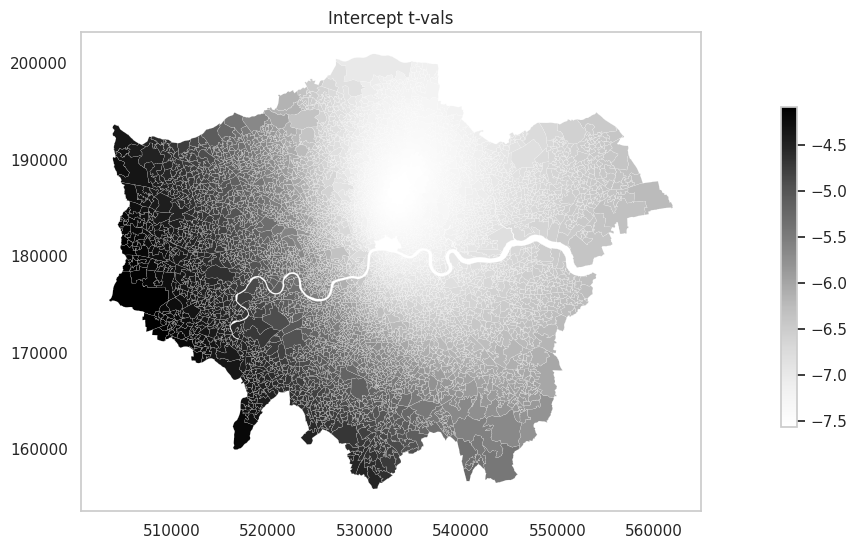

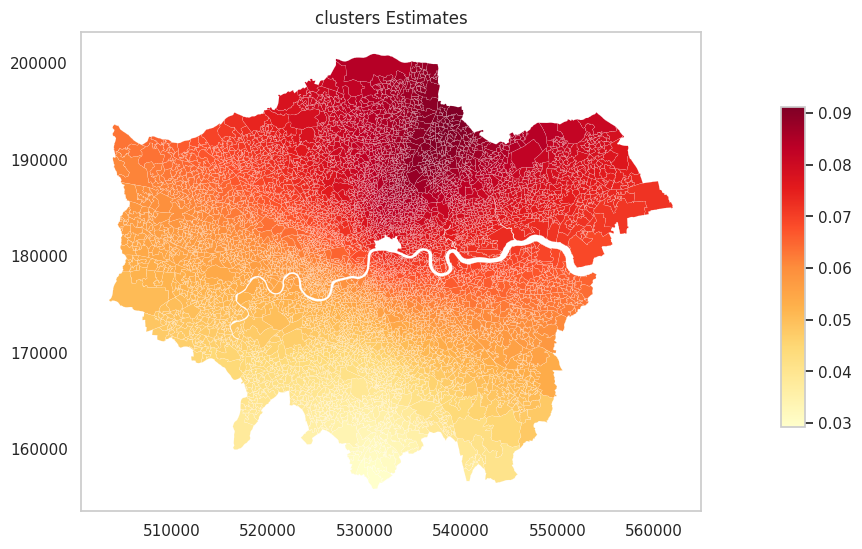

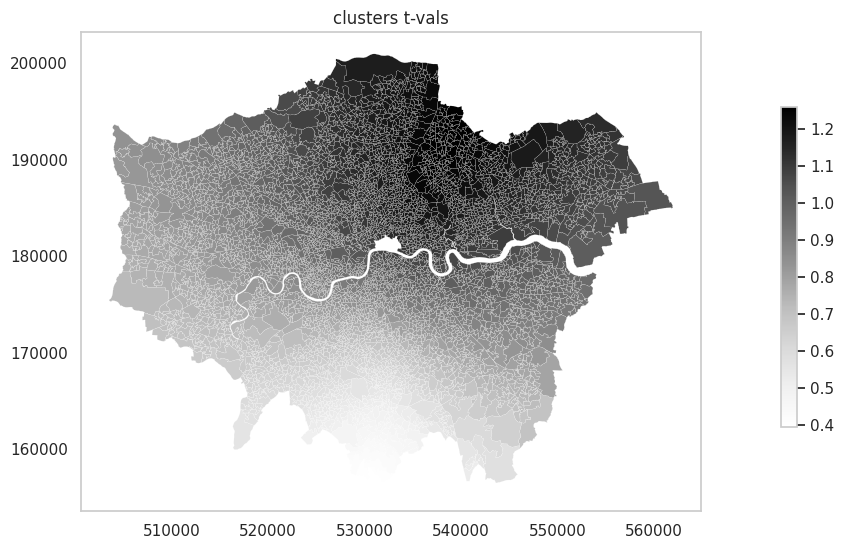

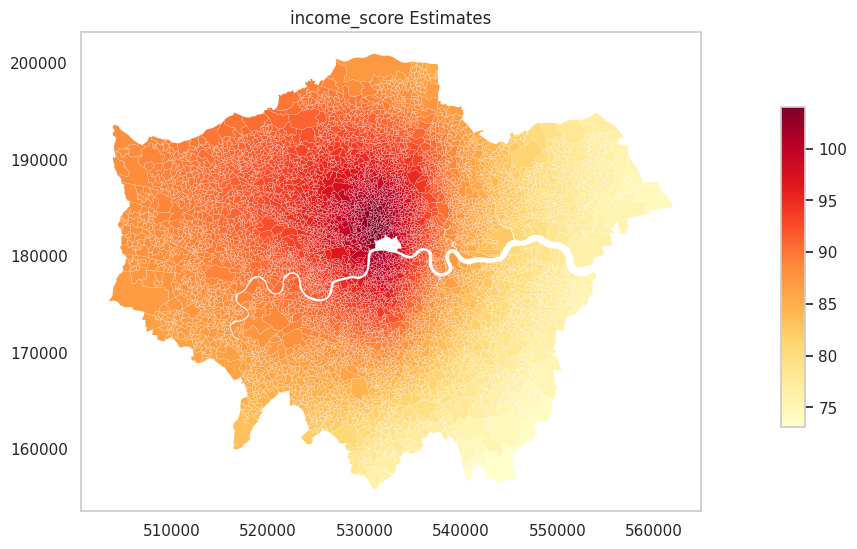

...

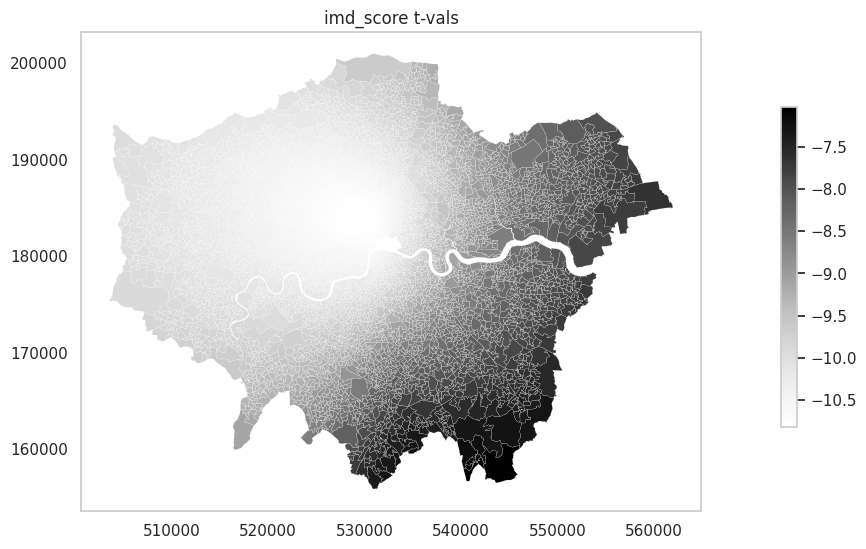

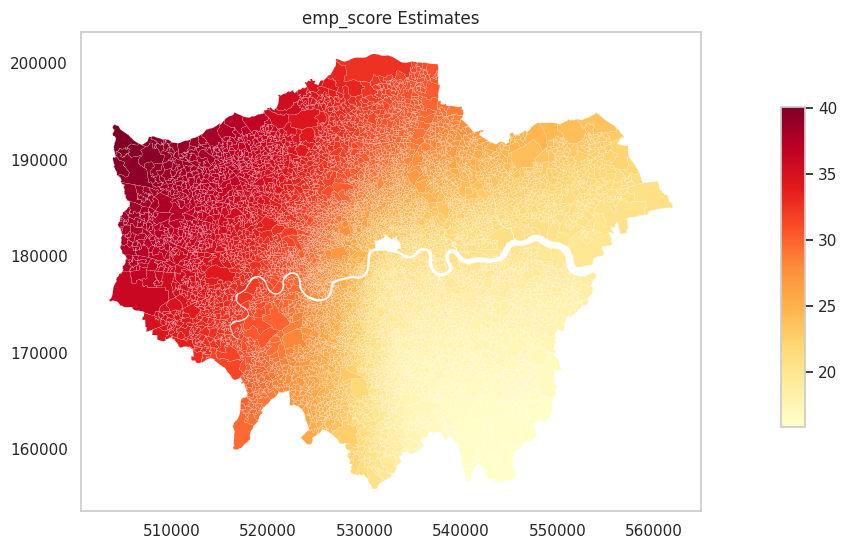

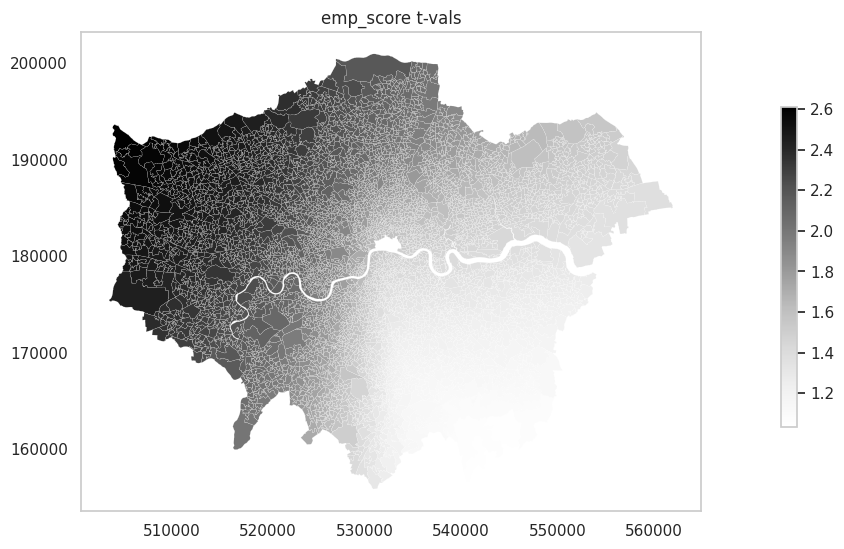

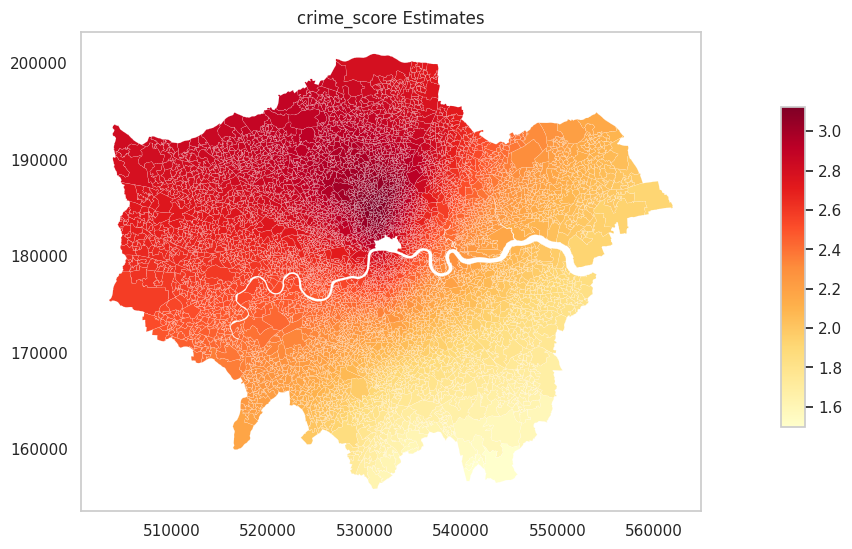

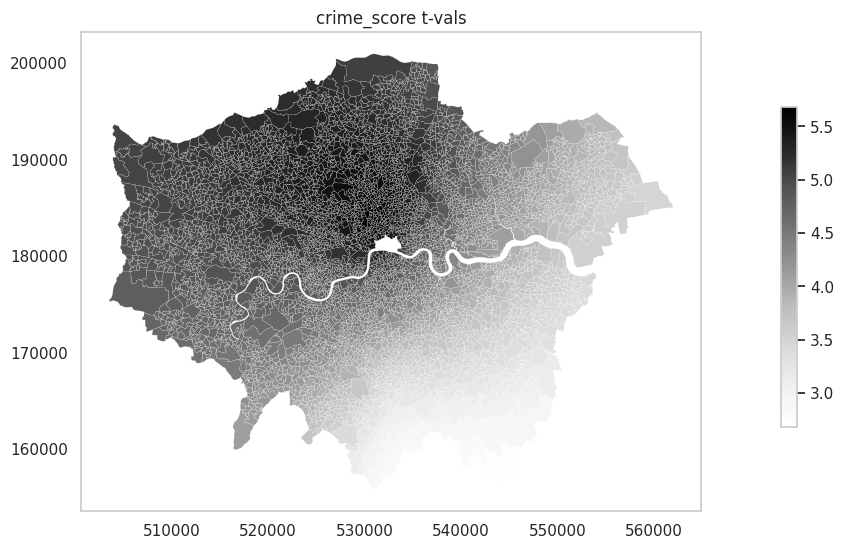

In [65]:
# Map Parameter estimates and T-vals for each covariate

for param in range(results.params.shape[1]):
    gwr_gdf[str(param)] = results.params[:,param]
    vmin, vmax = np.min(gwr_gdf[str(param)]), np.max(gwr_gdf[str(param)]) 

    ax = gwr_gdf.plot(str(param), vmin=vmin, vmax=vmax, figsize=(8,8), cmap='YlOrRd', linewidth=0.1)
    ax.set_title(labels[param] + ' Estimates')
    ax.axis('on')
    ax.grid(False)
    fig = ax.get_figure()
    cax = fig.add_axes([1.0, 0.3, 0.03, 0.4])
    
    sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='YlOrRd')
    sm._A = []
    fig.colorbar(sm, cax=cax)
    
    gwr_gdf[str(param)] = results.tvalues[:,param]
    vmin, vmax = np.min(gwr_gdf[str(param)]), np.max(gwr_gdf[str(param)]) 
    
    ax = gwr_gdf.plot(str(param), vmin=vmin, vmax=vmax, figsize=(8,8), cmap='Greys', linewidth=0.1)
    ax.set_title(labels[param] + ' t-vals')
    ax.axis('on')
    ax.grid(False)
    fig = ax.get_figure()
    cax = fig.add_axes([1.0, 0.3, 0.02, 0.4])

    sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='Greys')
    sm._A = []
    fig.colorbar(sm, cax=cax)

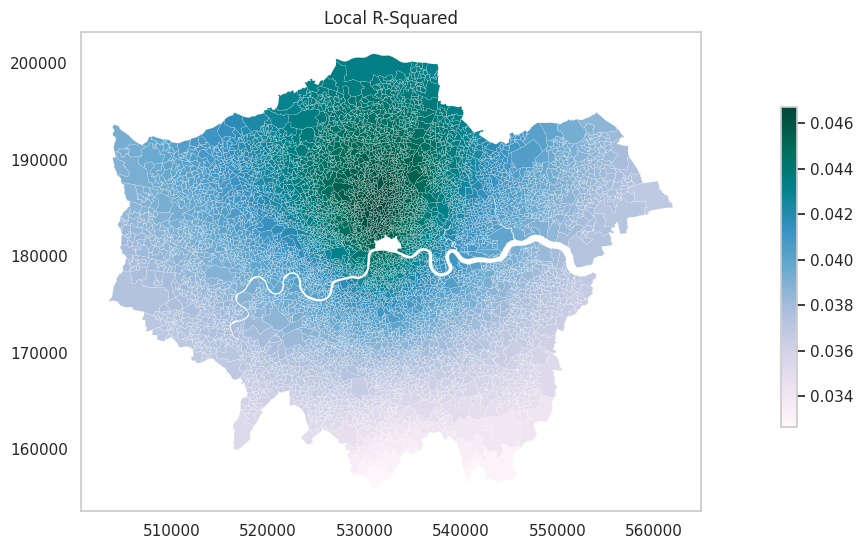

In [64]:
# Map local R-square values which is a weighted R-square at each observation location

gwr_gdf['localR2'] = results.localR2
vmin, vmax = np.min(gwr_gdf['localR2']), np.max(gwr_gdf['localR2'])

ax = gwr_gdf.plot('localR2', vmin=vmin, vmax=vmax, figsize=(8,8), cmap='PuBuGn', linewidth=0.1)
ax.axis('on')
ax.grid(False)
ax.set_title('Local R-Squared')
fig = ax.get_figure()
cax = fig.add_axes([1.0, 0.3, 0.02, 0.4])

sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='PuBuGn')
sm._A = []
fig.colorbar(sm, cax=cax)